# All Left Out Samples


#### Imports

In [1]:
### Basic Libraries

import numpy as np
import pandas as pd
import os
import sys
from sklearn.preprocessing import MinMaxScaler

#Utils
import src
from src import utils
from src import fc_utils
from src import linear_model
from src import plot_utils
from src import all_left_out


#### Data Processing

Cancer Cell Line Encyclopedia (CCLE) was accessed on 08 April 2024  from https://registry.opendata.aws/ccle.


Transcriptomics Data

In [2]:
CCLE_expression = pd.read_csv('Data/CCLE/CCLE_expression.csv', index_col='Unnamed: 0')
CCLE_sample_info = pd.read_csv('Data/CCLE/sample_info.csv')

In [3]:
print(f"mRNA dimensions:{CCLE_expression.shape}\ninformation dimensions:{CCLE_sample_info.shape}")

mRNA dimensions:(1376, 19182)
information dimensions:(1812, 26)


In [4]:
CCLE_expression.head()

,TSPAN6 (7105),TNMD (64102),DPM1 (8813),SCYL3 (57147),C1orf112 (55732),FGR (2268),CFH (3075),FUCA2 (2519),GCLC (2729),NFYA (4800),...,AC090517.4 (54816),AL160269.1 (11046),ABCF2-H2BE1 (114483834),FO393400.1 (149951),POLR2J3 (548644),H2BE1 (114483833),AL445238.1 (647264),GET1-SH3BGR (106865373),AC024598.1 (22891),AC113348.1 (102724657)
ACH-001113,4.990501,0.000000,7.273702,2.765535,4.480265,0.028569,1.269033,3.058316,6.483171,5.053980,...,0.111031,0.150560,1.427606,0.042644,5.781884,0.0,0.000000,0.799087,0.014355,0.000000
ACH-001289,5.209843,0.545968,7.070604,2.538538,3.510962,0.000000,0.176323,3.836934,4.200850,3.832890,...,0.310340,0.000000,0.807355,0.000000,4.704319,0.0,0.000000,0.464668,0.000000,0.070389
ACH-001339,3.779260,0.000000,7.346425,2.339137,4.254745,0.056584,1.339137,6.724241,3.671293,3.775051,...,0.176323,0.042644,1.384050,0.000000,4.931683,0.0,0.028569,0.263034,0.000000,0.000000
ACH-001538,5.726831,0.000000,7.086189,2.543496,3.102658,0.000000,5.914565,6.099716,4.475733,4.294253,...,0.263034,2.485427,0.713696,0.070389,3.858976,0.0,0.000000,0.000000,0.000000,0.000000
ACH-000242,7.465648,0.000000,6.435462,2.414136,3.864929,0.831877,7.198003,5.452530,7.112492,4.710944,...,0.163499,0.000000,1.117695,0.042644,4.990501,0.0,0.000000,0.000000,0.000000,0.000000


In [5]:
CCLE_sample_info.head() 

,DepMap_ID,cell_line_name,stripped_cell_line_name,CCLE_Name,alias,COSMICID,sex,source,Achilles_n_replicates,cell_line_NNMD,...,primary_or_metastasis,primary_disease,Subtype,age,Sanger_Model_ID,depmap_public_comments,lineage,lineage_subtype,lineage_sub_subtype,lineage_molecular_subtype
0,ACH-000001,NIH:OVCAR-3,NIHOVCAR3,NIHOVCAR3_OVARY,OVCAR3,905933.0,Female,ATCC,NaN,NaN,...,Metastasis,Ovarian Cancer,"Adenocarcinoma, high grade serous",60.0,SIDM00105,NaN,ovary,ovary_adenocarcinoma,high_grade_serous,NaN
1,ACH-000002,HL-60,HL60,HL60_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,NaN,905938.0,Female,ATCC,NaN,NaN,...,Primary,Leukemia,"Acute Myelogenous Leukemia (AML), M3 (Promyelo...",35.0,SIDM00829,NaN,blood,AML,M3,NaN
2,ACH-000003,CACO2,CACO2,CACO2_LARGE_INTESTINE,"CACO2, CaCo-2",NaN,Male,ATCC,NaN,NaN,...,NaN,Colon/Colorectal Cancer,Adenocarcinoma,NaN,SIDM00891,NaN,colorectal,colorectal_adenocarcinoma,NaN,NaN
3,ACH-000004,HEL,HEL,HEL_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,NaN,907053.0,Male,DSMZ,2.0,-3.079202,...,NaN,Leukemia,"Acute Myelogenous Leukemia (AML), M6 (Erythrol...",30.0,SIDM00594,NaN,blood,AML,M6,NaN
4,ACH-000005,HEL 92.1.7,HEL9217,HEL9217_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,NaN,NaN,Male,ATCC,2.0,-2.404409,...,NaN,Leukemia,"Acute Myelogenous Leukemia (AML), M6 (Erythrol...",30.0,SIDM00593,NaN,blood,AML,M6,NaN


In [6]:
# Create a dictionary mapping DepMap_ID to CCLE_Name
id_to_name_map = dict(zip(CCLE_sample_info['DepMap_ID'], CCLE_sample_info['CCLE_Name']))

# Rename indexes of ccle_transcriptomics using the id_to_name_map
CCLE_DepMap_ID = CCLE_expression.rename(index=id_to_name_map)
trascriptomics = CCLE_DepMap_ID.rename(columns=lambda x: str(x).split(' ')[0])

trascriptomics.head()

,TSPAN6,TNMD,DPM1,SCYL3,C1orf112,FGR,CFH,FUCA2,GCLC,NFYA,...,AC090517.4,AL160269.1,ABCF2-H2BE1,FO393400.1,POLR2J3,H2BE1,AL445238.1,GET1-SH3BGR,AC024598.1,AC113348.1
LC1SQSF_LUNG,4.990501,0.000000,7.273702,2.765535,4.480265,0.028569,1.269033,3.058316,6.483171,5.053980,...,0.111031,0.150560,1.427606,0.042644,5.781884,0.0,0.000000,0.799087,0.014355,0.000000
COGAR359_SOFT_TISSUE,5.209843,0.545968,7.070604,2.538538,3.510962,0.000000,0.176323,3.836934,4.200850,3.832890,...,0.310340,0.000000,0.807355,0.000000,4.704319,0.0,0.000000,0.464668,0.000000,0.070389
COLO794_SKIN,3.779260,0.000000,7.346425,2.339137,4.254745,0.056584,1.339137,6.724241,3.671293,3.775051,...,0.176323,0.042644,1.384050,0.000000,4.931683,0.0,0.028569,0.263034,0.000000,0.000000
KKU213_BILIARY_TRACT,5.726831,0.000000,7.086189,2.543496,3.102658,0.000000,5.914565,6.099716,4.475733,4.294253,...,0.263034,2.485427,0.713696,0.070389,3.858976,0.0,0.000000,0.000000,0.000000,0.000000
RT4_URINARY_TRACT,7.465648,0.000000,6.435462,2.414136,3.864929,0.831877,7.198003,5.452530,7.112492,4.710944,...,0.163499,0.000000,1.117695,0.042644,4.990501,0.0,0.000000,0.000000,0.000000,0.000000


Processes the DataFrame by replacing zeros with NaN (if no NaNs are present),
dropping rows with a high proportion of NaNs, computing the mean for protein isoforms,
and removing specific unwanted index entries.

In [7]:
trascriptomics_processed = utils.process(trascriptomics)
trascriptomics_processed.head()

Dimensions: (1376, 19182)


,TSPAN6,TNMD,DPM1,SCYL3,C1orf112,FGR,CFH,FUCA2,GCLC,NFYA,...,AC090517.4,AL160269.1,ABCF2-H2BE1,FO393400.1,POLR2J3,H2BE1,AL445238.1,GET1-SH3BGR,AC024598.1,AC113348.1
127399_SOFT_TISSUE,3.954196,0.0,6.816600,2.025029,3.931683,0.070389,0.070389,5.431957,3.810443,3.451541,...,0.176323,0.000000,2.823749,0.000000,4.375039,0.000000,0.000000,0.443607,0.000000,0.056584
143B_BONE,5.421897,0.0,7.310340,1.773996,3.789729,0.014355,0.695994,5.385431,4.619413,3.436961,...,0.084064,0.000000,0.422233,0.042644,2.592158,0.000000,0.000000,0.000000,0.000000,0.000000
22RV1_PROSTATE,2.643856,0.0,6.219556,3.418190,4.659925,0.014355,0.111031,5.846243,7.057883,5.288359,...,0.042644,0.056584,1.124328,0.028569,5.069960,0.000000,0.000000,1.803227,0.014355,0.000000
2313287_STOMACH,2.985500,0.0,6.778734,4.130931,3.778209,0.000000,0.298658,7.433794,6.689299,4.291309,...,0.367371,0.124328,2.192194,0.000000,4.358959,0.000000,0.042644,0.097611,0.000000,0.000000
253JBV_URINARY_TRACT,4.553361,0.0,5.830103,1.867896,3.581351,0.000000,0.084064,5.014355,4.447579,3.919340,...,0.084064,0.298658,3.241840,0.150560,5.899901,0.111031,0.000000,0.356144,0.000000,0.000000


Proteomics Data

In [8]:
proteomics_expression = pd.read_csv('Data/CCLE/Proteomics/protein_quant_current_normalized.csv', index_col=0)

In [9]:
print(f"proteomics dimensions: {proteomics_expression.shape}")

proteomics dimensions: (12755, 425)


In [10]:
proteomics_expression.head()

,Gene_Symbol,Description,Group_ID,Uniprot,Uniprot_Acc,TenPx01_Peptides,TenPx02_Peptides,TenPx03_Peptides,TenPx04_Peptides,TenPx06_Peptides,...,NCIH2030_LUNG_TenPx18,22RV1_PROSTATE_TenPx24,A172_CENTRAL_NERVOUS_SYSTEM_TenPx24,BT20_BREAST_TenPx24,CALU6_LUNG_TenPx24,FADU_UPPER_AERODIGESTIVE_TRACT_TenPx24,KP4_PANCREAS_TenPx24,MONOMAC6_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE_TenPx24,OVCAR8_OVARY_TenPx24,THP1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE_TenPx24
Protein_Id,,,,,,,,,,,,,,,,,,,,,
sp|P55011|S12A2_HUMAN,SLC12A2,S12A2_HUMAN Solute carrier family 12 member 2,0,S12A2_HUMAN,P55011,41,16,23,59,44,...,-1.345024,1.811205,-0.921176,-1.045727,0.845574,-0.071063,0.702306,-1.395878,-1.165032,-0.547536
sp|P35453|HXD13_HUMAN,HOXD13,HXD13_HUMAN Homeobox protein Hox-D13,1,HXD13_HUMAN,P35453,0,0,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
sp|O60341|KDM1A_HUMAN,KDM1A,KDM1A_HUMAN Lysine-specific histone demethylas...,2,KDM1A_HUMAN,O60341,25,35,37,40,33,...,0.161196,-0.337994,-0.455601,0.392393,0.258380,-0.817245,-0.790010,0.929522,-0.828736,0.735431
sp|O00570|SOX1_HUMAN,SOX1,SOX1_HUMAN Transcription factor SOX-1,4,SOX1_HUMAN,O00570,0,0,1,0,0,...,-0.040198,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
sp|P48431|SOX2_HUMAN,SOX2,SOX2_HUMAN Transcription factor SOX-2,4,SOX2_HUMAN,P48431,1,0,2,1,2,...,-4.627606,-1.261703,1.136851,-3.179027,1.424570,2.549687,4.424095,-1.083698,-1.640990,-2.905547


In [11]:
proteomics_expression.set_index('Gene_Symbol', inplace=True)
proteomics = proteomics_expression.loc[:,  proteomics_expression.columns.str.contains('_TenPx')]

In [12]:
fc_utils.get_repeated_sample_names(proteomics)

['HCT15_LARGE_INTESTINE', 'CAL120_BREAST', 'SW948_LARGE_INTESTINE']


The designated cell lines have been replicated across multiple Ten-plex experiments, yet there appears to be a minimal correlation between these replicated datasets. Therefore, in line with the protocols recommended in "A Guide to the Quantitative Proteomic Profiles of the Cancer Cell Line Encyclopedia," it is advised to select for retention only those cell lines that exhibit strong correlation with the transcriptomic data. This criterion ensures the use of the most relevant and reliable data for subsequent analyses.


In [13]:
repeated_samples = fc_utils.get_repeated_sample_names(proteomics)

In [14]:
# Eliminating the cell lines that do not correlate well with transcriptomics data as mentioned in the paper 
proteomics.drop(columns=['SW948_LARGE_INTESTINE_TenPx11', 'CAL120_BREAST_TenPx02', 'HCT15_LARGE_INTESTINE_TenPx30'], 
                    inplace=True)
proteomics = proteomics.rename(columns = lambda x : str(x).split('_TenPx')[0])

C:\Users\hp\AppData\Local\Temp\ipykernel_23296\283973742.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proteomics.drop(columns=['SW948_LARGE_INTESTINE_TenPx11', 'CAL120_BREAST_TenPx02', 'HCT15_LARGE_INTESTINE_TenPx30'],


In [15]:
proteomics_processed = utils.process(proteomics)
proteomics_processed.head()

Dimensions: (7372, 375)


,MDAMB468_BREAST,SH4_SKIN,AU565_BREAST,KMRC1_KIDNEY,CAL51_BREAST,RPMI7951_SKIN,RERFLCMS_LUNG,IGR37_SKIN,VMRCRCW_KIDNEY,HEP3B217_LIVER,...,NCIH2030_LUNG,22RV1_PROSTATE,A172_CENTRAL_NERVOUS_SYSTEM,BT20_BREAST,CALU6_LUNG,FADU_UPPER_AERODIGESTIVE_TRACT,KP4_PANCREAS,MONOMAC6_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,OVCAR8_OVARY,THP1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
Gene_Symbol,,,,,,,,,,,,,,,,,,,,,
A2M,-0.345562,1.642186,-1.129114,1.493333,0.274652,-0.615667,-0.957249,-0.174494,-0.987932,1.513325,...,-0.981657,-0.921538,3.905544,-0.649348,-1.055916,-1.116991,1.922976,-1.106344,-0.770372,-1.342713
AAAS,-0.109405,-0.283335,0.024663,-0.588886,0.673324,0.010466,0.474615,0.037159,-0.362833,-0.225824,...,-0.093176,-0.518686,-0.642067,-0.188224,-0.259101,-0.779655,-0.628770,1.205109,-0.584588,1.622359
AACS,0.370945,0.162102,1.071283,0.404605,-0.587890,0.025699,-0.767258,-0.598630,0.219004,-0.319453,...,-0.887698,-0.488146,0.356932,0.936065,-0.876305,-0.343373,-1.200965,0.660346,-0.442688,0.662618
AAGAB,0.009639,-0.057517,-0.758048,-0.210457,-0.044001,0.381038,0.093162,0.303576,0.319783,-0.023510,...,0.756894,-1.125006,0.195036,1.314434,-0.362100,0.032533,2.101721,-0.539838,0.256127,-0.745283
AAK1,0.005800,0.760639,-0.320451,0.533949,-0.778679,0.333378,-0.111288,-0.267637,0.289226,-0.408265,...,0.154595,-0.627264,0.595116,1.415555,-0.291160,-1.433436,-0.549493,0.951283,-0.329806,0.751036


In [16]:
proteomics_processed

,MDAMB468_BREAST,SH4_SKIN,AU565_BREAST,KMRC1_KIDNEY,CAL51_BREAST,RPMI7951_SKIN,RERFLCMS_LUNG,IGR37_SKIN,VMRCRCW_KIDNEY,HEP3B217_LIVER,...,NCIH2030_LUNG,22RV1_PROSTATE,A172_CENTRAL_NERVOUS_SYSTEM,BT20_BREAST,CALU6_LUNG,FADU_UPPER_AERODIGESTIVE_TRACT,KP4_PANCREAS,MONOMAC6_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,OVCAR8_OVARY,THP1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
Gene_Symbol,,,,,,,,,,,,,,,,,,,,,
A2M,-0.345562,1.642186,-1.129114,1.493333,0.274652,-0.615667,-0.957249,-0.174494,-0.987932,1.513325,...,-0.981657,-0.921538,3.905544,-0.649348,-1.055916,-1.116991,1.922976,-1.106344,-0.770372,-1.342713
AAAS,-0.109405,-0.283335,0.024663,-0.588886,0.673324,0.010466,0.474615,0.037159,-0.362833,-0.225824,...,-0.093176,-0.518686,-0.642067,-0.188224,-0.259101,-0.779655,-0.628770,1.205109,-0.584588,1.622359
AACS,0.370945,0.162102,1.071283,0.404605,-0.587890,0.025699,-0.767258,-0.598630,0.219004,-0.319453,...,-0.887698,-0.488146,0.356932,0.936065,-0.876305,-0.343373,-1.200965,0.660346,-0.442688,0.662618
AAGAB,0.009639,-0.057517,-0.758048,-0.210457,-0.044001,0.381038,0.093162,0.303576,0.319783,-0.023510,...,0.756894,-1.125006,0.195036,1.314434,-0.362100,0.032533,2.101721,-0.539838,0.256127,-0.745283
AAK1,0.005800,0.760639,-0.320451,0.533949,-0.778679,0.333378,-0.111288,-0.267637,0.289226,-0.408265,...,0.154595,-0.627264,0.595116,1.415555,-0.291160,-1.433436,-0.549493,0.951283,-0.329806,0.751036
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZWINT,0.038065,0.106128,-0.208808,-0.474452,0.393031,0.114784,0.185306,-0.024297,-0.078597,-0.635553,...,0.600039,-0.715251,-0.137385,0.126959,0.428678,-0.293874,1.182241,-0.098364,0.852012,-0.069975
ZYG11B,0.500724,-0.005296,-0.323680,-0.082596,-0.055763,0.098731,-0.155971,0.177678,-0.105570,-0.193009,...,0.031254,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ZYX,-1.032888,-0.361225,0.309026,0.574568,-0.218916,0.349964,0.104404,-0.841383,1.468625,-0.226393,...,0.386947,-1.931278,0.156044,0.417887,-0.183293,-0.306374,1.281937,-0.498927,0.868852,1.657038


In [17]:
ccle_transcr, ccle_prot= utils.match_proteins_samples(trascriptomics_processed.transpose(), proteomics_processed)

Number of common proteins: 6987
Number of common samples: 369


In [18]:
ccle_transcr

,22RV1_PROSTATE,697_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,769P_KIDNEY,786O_KIDNEY,8305C_THYROID,8505C_THYROID,A101D_SKIN,A172_CENTRAL_NERVOUS_SYSTEM,A204_SOFT_TISSUE,A2058_SKIN,...,UBLC1_URINARY_TRACT,UMUC3_URINARY_TRACT,VCAP_PROSTATE,VMRCRCW_KIDNEY,WM115_SKIN,WM1799_SKIN,WM2664_SKIN,WM793_SKIN,WM88_SKIN,ZR751_BREAST
TSPAN6,2.643856,0.150560,3.405992,2.987321,4.285402,4.711495,3.467279,0.189034,2.655352,4.015248,...,6.835040,3.926948,2.978196,3.132577,3.886550,3.822730,4.524189,3.147307,3.845992,3.158660
DPM1,6.219556,5.443607,6.294437,7.112387,6.880686,6.942515,7.092229,6.642268,6.542568,6.583760,...,6.930383,7.010444,5.832637,6.457791,6.048759,6.647171,6.158862,6.655352,7.400623,7.092229
SCYL3,3.418190,2.384050,2.304511,1.887525,1.887525,1.843984,2.204767,2.330558,3.282440,2.615887,...,1.469886,1.891419,2.825786,2.286881,2.615887,2.735522,2.568032,2.722466,3.560715,4.063503
FUCA2,5.846243,0.356144,6.443772,6.838195,4.232661,5.819413,6.422738,5.979339,6.559033,6.557808,...,7.002703,6.529977,4.709842,5.015694,4.905928,5.247928,6.157448,6.754888,4.140779,4.381283
GCLC,7.057883,4.283181,4.618239,4.200850,3.477677,3.736605,4.738227,3.360364,2.956057,4.205549,...,3.301588,3.854993,4.727376,5.828581,4.313246,4.094236,4.578335,4.310340,4.456149,4.049631
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MRPL45,5.591261,5.230741,5.642124,5.148527,5.229588,5.589464,5.259272,5.386466,5.641835,5.415488,...,5.381283,5.339137,6.062424,5.623808,5.176722,5.513175,5.330917,4.839456,5.229203,5.952799
PAGR1,5.563463,5.640968,4.564378,4.657640,4.972233,5.216455,4.791814,5.249066,5.460415,5.131343,...,3.382667,4.766595,4.957450,4.839960,4.931210,4.766065,4.695437,5.432959,4.898692,5.804002
SCO2,1.794936,2.319040,1.883621,1.250962,1.232661,0.855990,2.313246,0.910733,1.269033,1.879706,...,0.000000,1.959770,1.384050,2.776104,0.695994,1.673556,0.000000,1.378512,2.541019,1.887525
TBCE,5.403268,4.819668,5.723559,5.305971,4.517276,4.450881,4.894818,4.948601,5.036943,5.198494,...,5.048323,4.802193,5.182295,5.439291,5.463361,5.414136,5.313971,5.061344,5.639232,5.710669


#### Correlations

In [19]:
spearman_corr_ccle = utils.correlate_genewise(ccle_transcr, ccle_prot, 'Spearman')
spearman_corr_ccle.sort_values(by='Spearman', ascending=False, inplace=True)
pearson_corr_ccle = utils.correlate_genewise(ccle_transcr, ccle_prot, 'Pearson', 'pearson')
pearson_corr_ccle.sort_values(by = 'Pearson', ascending=False, inplace=True)

Median Spearman Correlation: 0.4566
Median Pearson Correlation: 0.4776


Pearson - Median: 0.4776054233797681, Mean: 0.47049058800792315, Mode: 0.52
Spearman - Median: 0.4566072482652153, Mean: 0.45107809347844174, Mode: 0.4


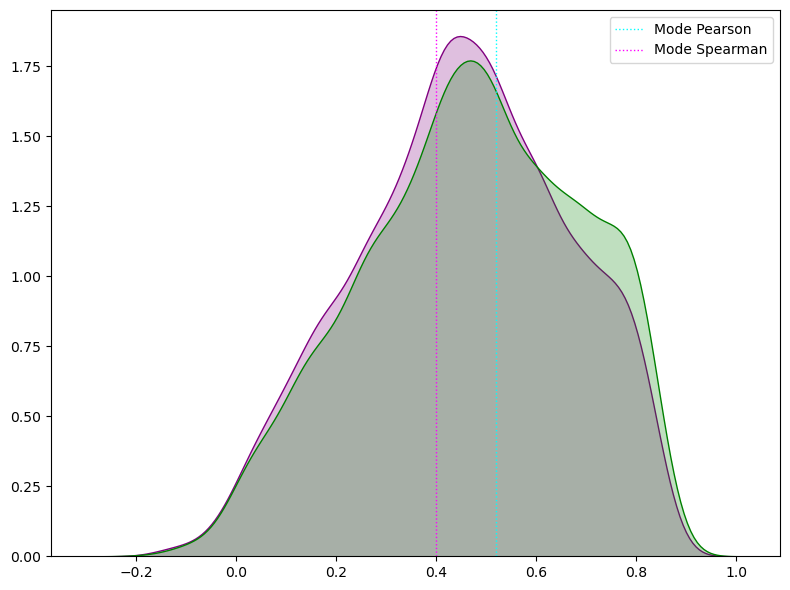

In [20]:
plot_utils.compare_datasets2(pearson_corr_ccle,spearman_corr_ccle, 'Pearson', 'Spearman')

In [21]:
correlations = pearson_corr_ccle.join(spearman_corr_ccle) 

In [22]:
correlations

,Pearson,Spearman
A2M,0.373828,0.230195
AAAS,0.033262,0.054040
AACS,0.475468,0.446383
AAGAB,0.345481,0.402540
AAK1,0.623951,0.585448
...,...,...
ZWINT,0.287495,0.285369
ZYG11B,0.327869,0.335152
ZYX,0.685739,0.657462
ZZEF1,0.343196,0.383925


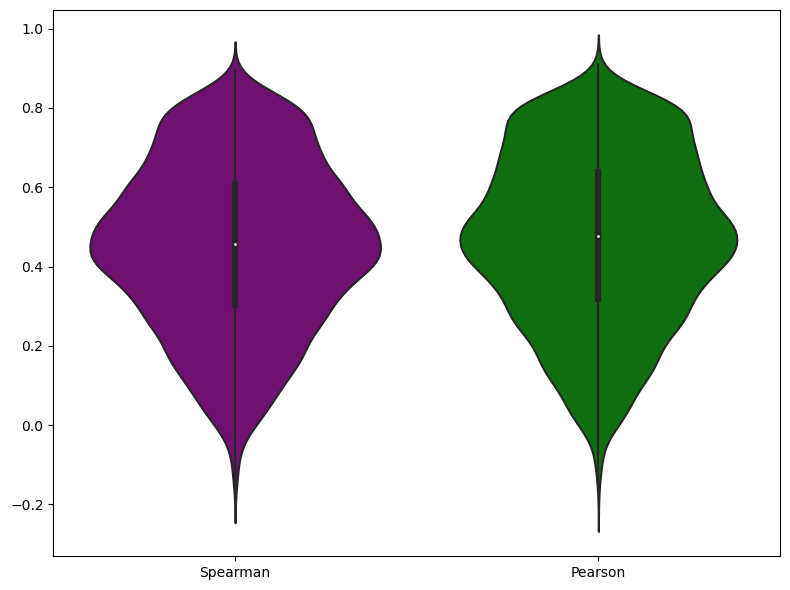

In [23]:
plot_utils.compare_datasets3(correlations['Spearman'], correlations['Pearson'])

#### Scale

In [24]:
ccle_transcr = ccle_transcr.transpose()

In [25]:
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(ccle_transcr)
scaled_transcr = pd.DataFrame(scaled_data, columns=ccle_transcr.columns, index=ccle_transcr.index)

In [26]:
ccle_prot = ccle_prot.transpose()

In [27]:
scaled_data = scaler.fit_transform(ccle_prot)
scaled_prot = pd.DataFrame(scaled_data, columns=ccle_prot.columns, index=ccle_prot.index)
scaled_prot = scaled_prot.dropna(axis='columns', how='any')
ccle_prot = ccle_prot.dropna(axis='columns', how = 'any')
scaled_prot.shape

(369, 4843)

In [28]:
indexes = scaled_prot.index
protein_list = scaled_prot.columns 
protein_list

Index(['TSPAN6', 'DPM1', 'FUCA2', 'GCLC', 'LAS1L', 'ANKIB1', 'CYP51A1', 'BAD',
       'LAP3', 'CD99',
       ...
       'MARCKS', 'PSMB3', 'DDX52', 'MYO19', 'DHRS11', 'ACACA', 'MRM1',
       'MRPL45', 'SCO2', 'TBCE'],
      dtype='object', length=4843)

In [29]:
correlations = correlations.loc[protein_list]

In [30]:
correlations

,Pearson,Spearman
TSPAN6,0.768560,0.666064
DPM1,0.249829,0.203143
FUCA2,0.626354,0.477634
GCLC,0.711642,0.661082
LAS1L,0.143441,0.162996
...,...,...
SCO2,0.064271,0.091374
TBCE,0.529427,0.502925
TBCE,0.529427,0.264976
TBCE,0.263538,0.502925


leave one sample out -> cross val -> model with L1 and L2 -> run regression on the dateset without the sample removed, use the model to predict the left out

## ElasticNET All Tissues Left Out - 4843 Proteins -

In [31]:
index_list = pd.read_csv('index_list.csv', index_col=0)

In [32]:
proteins = pd.Index(index_list['Prot_list'])

In [33]:
proteins

Index(['FARP1', 'NCOR1', 'MTA2', 'PHF2', 'STX7', 'CDC73', 'LACTB', 'RP9',
       'COL1A2', 'ATP11C',
       ...
       'GPAA1', 'EVPL', 'BAG2', 'KAT7', 'GDAP1', 'TDP2', 'KIF5B', 'GPD2',
       'PEG10', 'GATM'],
      dtype='object', name='Prot_list', length=973)

In [34]:
protein_list = np.array(proteins)

batches = np.array_split(protein_list, 48)
for i, batch in enumerate(batches):
    print(f"Batch {i + 1}: {batch.tolist()}")

Batch 1: ['FARP1', 'NCOR1', 'MTA2', 'PHF2', 'STX7', 'CDC73', 'LACTB', 'RP9', 'COL1A2', 'ATP11C', 'THYN1', 'RRP12', 'NDUFB8', 'FCHO2', 'CYFIP1', 'ATF2', 'GRIPAP1', 'PLEC', 'RPL30', 'SERPINB9', 'SIRT1']
Batch 2: ['RPA2', 'WDR89', 'PAK1IP1', 'RPA3', 'PLEK', 'AMOTL2', 'COLGALT1', 'DNAJC9', 'GALNT2', 'CSTF2T', 'WRAP53', 'TRIO', 'SDC4', 'P4HTM', 'PTBP2', 'GHDC', 'NUP214', 'CEP250', 'ARPC1A', 'BMS1', 'DTD1']
Batch 3: ['CTSL', 'WDR48', 'ALG1', 'ADAM9', 'COPS7B', 'NOC2L', 'IFNGR1', 'UBXN6', 'RBM5', 'CASP4', 'DAB2', 'PLOD3', 'CAT', 'NLN', 'UBE2R2', 'SUPT6H', 'NUCKS1', 'TMX2', 'HMGA2', 'CHD9', 'DNAJB12']
Batch 4: ['RNF5', 'RCC2', 'CWC22', 'MIB1', 'GTF2I', 'STOM', 'BCL2L13', 'RBBP6', 'CERS2', 'TMUB1', 'HSPA2', 'NCS1', 'TONSL', 'DPYSL3', 'MTHFD2', 'UBN1', 'COPS4', 'FUNDC2', 'PANX1', 'ESD', 'SIN3B']
Batch 5: ['MED28', 'TRAFD1', 'POLRMT', 'EPN1', 'UBE2E2', 'MGST1', 'CNP', 'PPIE', 'PWP1', 'NSFL1C', 'RETSAT', 'MYOF', 'PABPC4', 'PPIC', 'MANBA', 'WASL', 'NELFCD', 'KDM5D', 'TAOK3', 'BRD1', 'MT-CO2']
Batch

In [35]:
for i, batch in enumerate(batches):
    globals()[f'batch{i + 1}'] = batch

# Optionally print each batch to verify
for i in range(48):
    print(f"batch{i + 1}: {globals()[f'batch{i + 1}'].tolist()}")

batch1: ['FARP1', 'NCOR1', 'MTA2', 'PHF2', 'STX7', 'CDC73', 'LACTB', 'RP9', 'COL1A2', 'ATP11C', 'THYN1', 'RRP12', 'NDUFB8', 'FCHO2', 'CYFIP1', 'ATF2', 'GRIPAP1', 'PLEC', 'RPL30', 'SERPINB9', 'SIRT1']
batch2: ['RPA2', 'WDR89', 'PAK1IP1', 'RPA3', 'PLEK', 'AMOTL2', 'COLGALT1', 'DNAJC9', 'GALNT2', 'CSTF2T', 'WRAP53', 'TRIO', 'SDC4', 'P4HTM', 'PTBP2', 'GHDC', 'NUP214', 'CEP250', 'ARPC1A', 'BMS1', 'DTD1']
batch3: ['CTSL', 'WDR48', 'ALG1', 'ADAM9', 'COPS7B', 'NOC2L', 'IFNGR1', 'UBXN6', 'RBM5', 'CASP4', 'DAB2', 'PLOD3', 'CAT', 'NLN', 'UBE2R2', 'SUPT6H', 'NUCKS1', 'TMX2', 'HMGA2', 'CHD9', 'DNAJB12']
batch4: ['RNF5', 'RCC2', 'CWC22', 'MIB1', 'GTF2I', 'STOM', 'BCL2L13', 'RBBP6', 'CERS2', 'TMUB1', 'HSPA2', 'NCS1', 'TONSL', 'DPYSL3', 'MTHFD2', 'UBN1', 'COPS4', 'FUNDC2', 'PANX1', 'ESD', 'SIN3B']
batch5: ['MED28', 'TRAFD1', 'POLRMT', 'EPN1', 'UBE2E2', 'MGST1', 'CNP', 'PPIE', 'PWP1', 'NSFL1C', 'RETSAT', 'MYOF', 'PABPC4', 'PPIC', 'MANBA', 'WASL', 'NELFCD', 'KDM5D', 'TAOK3', 'BRD1', 'MT-CO2']
batch6: ['

#### 20 features - All Left Out - 4843 Proteins - 

In [37]:
counts_dict = all_left_out.count_samples_by_tissue(scaled_transcr)
print(counts_dict)
total = sum(counts_dict.values())

tissue_samples = all_left_out.select_samples_by_tissue1(counts_dict, scaled_transcr)



{'PROSTATE': 4, 'HAEMATOPOIETIC_AND_LYMPHOID_TISSUE': 40, 'KIDNEY': 11, 'THYROID': 2, 'SKIN': 33, 'CENTRAL_NERVOUS_SYSTEM': 13, 'SOFT_TISSUE': 8, 'OVARY': 17, 'LUNG': 75, 'BONE': 7, 'STOMACH': 14, 'PANCREAS': 19, 'BREAST': 30, 'UPPER_AERODIGESTIVE_TRACT': 10, 'LARGE_INTESTINE': 29, 'ENDOMETRIUM': 14, 'LIVER': 14, 'URINARY_TRACT': 11, 'OESOPHAGUS': 14, 'PLEURA': 2, 'AUTONOMIC_GANGLIA': 1, 'BILIARY_TRACT': 1}


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

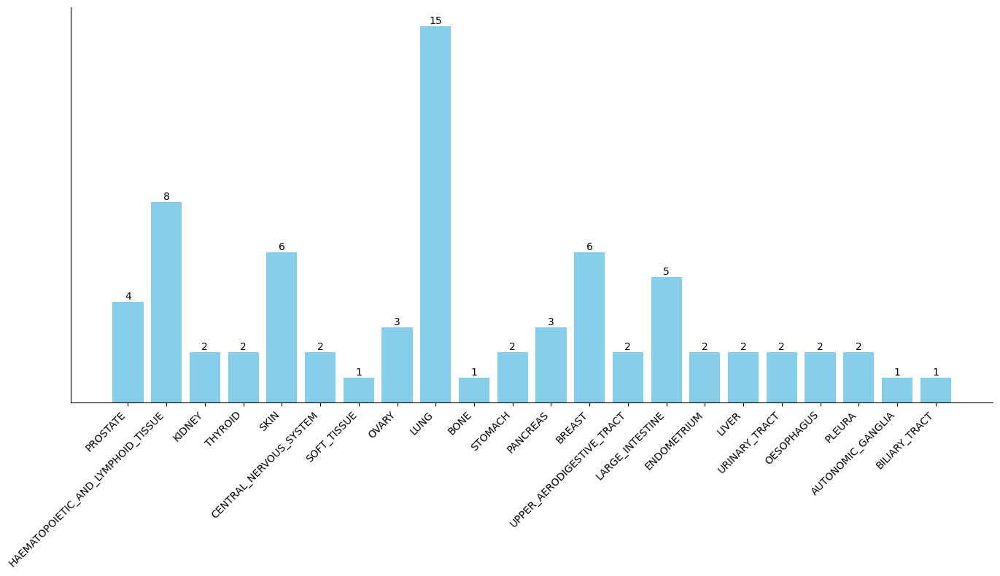

In [ ]:
tissue_sample_counts = {tissue: len(samples) for tissue, samples in tissue_samples.items()}

# Extracting data from the dictionary
tissues = list(tissue_sample_counts.keys())
counts = list(tissue_sample_counts.values())

# Plotting the bar chart
plt.figure(figsize=(14, 8))
bars = plt.bar(tissues, counts, color='skyblue')

# Adding labels and title
plt.xlabel('')
plt.ylabel('')
plt.title('')
plt.xticks(rotation=45, ha='right')  # Rotate the x-axis labels for better readability
plt.yticks([])
# Adding count labels on top of the bars
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2.0, height, f'{height}', ha='center', va='bottom')

# Display the plot
plt.tight_layout()
sns.despine()
plt.show()


In [38]:
###this chooses al samples
tissue_samples = all_left_out.select_samples_by_tissue1(counts_dict, scaled_transcr)

In [39]:
tissue_samples

{'PROSTATE': ['22RV1_PROSTATE',
  'LNCAPCLONEFGC_PROSTATE',
  'PC3_PROSTATE',
  'VCAP_PROSTATE'],
 'HAEMATOPOIETIC_AND_LYMPHOID_TISSUE': ['697_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE',
  'CMK_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE',
  'EOL1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE',
  'F36P_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE',
  'HDMYZ_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE',
  'HEL9217_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE',
  'HEL_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE',
  'JEKO1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE',
  'JM1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE',
  'JURKAT_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE',
  'K562_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE',
  'KARPAS299_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE',
  'KARPAS422_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE',
  'KASUMI1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE',
  'KASUMI2_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE',
  'KMS11_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE',
  'KMS12BM_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE',
  'KMS27_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE',
  'L428_HAEMATOPOIETIC_AND_LYM

In [47]:
full_results = pd.DataFrame()
for protein in batch1:
    result_df = all_left_out.pipeline_AllLeftOut(scaled_transcr, scaled_transcr, num_features= 20, protein = protein, indexes=indexes, tissue_samples = tissue_samples)
    full_results = pd.concat([full_results, result_df.to_frame().T])

Processing protein: FARP1
  Processing sample: 22RV1_PROSTATE
  Processing sample: LNCAPCLONEFGC_PROSTATE
  Processing sample: PC3_PROSTATE
  Processing sample: VCAP_PROSTATE
  Processing sample: 697_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: CMK_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: EOL1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: F36P_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HDMYZ_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HEL9217_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HEL_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JEKO1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JM1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JURKAT_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: K562_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: KARPAS299_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: KARPAS422_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample

In [48]:
for protein in batch2:
    result_df = all_left_out.pipeline_AllLeftOut(scaled_transcr, scaled_transcr, num_features= 20
                                                 , protein = protein, indexes=indexes, tissue_samples = tissue_samples)
    full_results = pd.concat([full_results, result_df.to_frame().T])


Processing protein: RPA2
  Processing sample: 22RV1_PROSTATE
  Processing sample: LNCAPCLONEFGC_PROSTATE
  Processing sample: PC3_PROSTATE
  Processing sample: VCAP_PROSTATE
  Processing sample: 697_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: CMK_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: EOL1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: F36P_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HDMYZ_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HEL9217_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HEL_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JEKO1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JM1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JURKAT_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: K562_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: KARPAS299_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: KARPAS422_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample:

In [49]:
for protein in batch3:
    try:
        result_df = all_left_out.pipeline_AllLeftOut(scaled_transcr, scaled_transcr, num_features= 20
                                                    , protein = protein, indexes=indexes, tissue_samples = tissue_samples)
        full_results = pd.concat([full_results, result_df.to_frame().T])
    except Exception as e:
        print(f"Error processing protein {protein}: {e}")
        continue

Processing protein: CTSL
  Processing sample: 22RV1_PROSTATE
  Processing sample: LNCAPCLONEFGC_PROSTATE
  Processing sample: PC3_PROSTATE
  Processing sample: VCAP_PROSTATE
  Processing sample: 697_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: CMK_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: EOL1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: F36P_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HDMYZ_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HEL9217_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HEL_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JEKO1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JM1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JURKAT_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: K562_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: KARPAS299_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: KARPAS422_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample:

In [50]:
for protein in batch4:
    try:
        result_df = all_left_out.pipeline_AllLeftOut(scaled_transcr, scaled_transcr, num_features= 20
                                                    , protein = protein, indexes=indexes, tissue_samples = tissue_samples)
        full_results = pd.concat([full_results, result_df.to_frame().T])
    except Exception as e:
        print(f"Error processing protein {protein}: {e}")
        continue  

Processing protein: RNF5
  Processing sample: 22RV1_PROSTATE
  Processing sample: LNCAPCLONEFGC_PROSTATE
  Processing sample: PC3_PROSTATE
  Processing sample: VCAP_PROSTATE
  Processing sample: 697_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: CMK_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: EOL1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: F36P_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HDMYZ_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HEL9217_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HEL_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JEKO1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JM1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JURKAT_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: K562_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: KARPAS299_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: KARPAS422_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample:

In [51]:
for protein in batch5:
    try:
        result_df = all_left_out.pipeline_AllLeftOut(scaled_transcr, scaled_transcr, num_features= 20
                                                    , protein = protein, indexes=indexes, tissue_samples = tissue_samples)
        full_results = pd.concat([full_results, result_df.to_frame().T])
    except Exception as e:
        print(f"Error processing protein {protein}: {e}")
        continue


Processing protein: MED28
  Processing sample: 22RV1_PROSTATE
  Processing sample: LNCAPCLONEFGC_PROSTATE
  Processing sample: PC3_PROSTATE
  Processing sample: VCAP_PROSTATE
  Processing sample: 697_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: CMK_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: EOL1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: F36P_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HDMYZ_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HEL9217_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HEL_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JEKO1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JM1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JURKAT_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: K562_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: KARPAS299_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: KARPAS422_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample

In [52]:
for protein in batch6:
    try:
        result_df = all_left_out.pipeline_AllLeftOut(scaled_transcr, scaled_transcr, num_features= 20
                                                    , protein = protein, indexes=indexes, tissue_samples = tissue_samples)
        full_results = pd.concat([full_results, result_df.to_frame().T])
    except Exception as e:
        print(f"Error processing protein {protein}: {e}")
        continue

Processing protein: DDX46
  Processing sample: 22RV1_PROSTATE
  Processing sample: LNCAPCLONEFGC_PROSTATE
  Processing sample: PC3_PROSTATE
  Processing sample: VCAP_PROSTATE
  Processing sample: 697_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: CMK_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: EOL1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: F36P_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HDMYZ_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HEL9217_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HEL_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JEKO1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JM1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JURKAT_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: K562_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: KARPAS299_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: KARPAS422_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample

In [53]:
for protein in batch7:
    try:
        result_df = all_left_out.pipeline_AllLeftOut(scaled_transcr, scaled_transcr, num_features= 20
                                                    , protein = protein, indexes=indexes, tissue_samples = tissue_samples)
        full_results = pd.concat([full_results, result_df.to_frame().T])
    except Exception as e:
        print(f"Error processing protein {protein}: {e}")
        continue


Processing protein: KAT8
  Processing sample: 22RV1_PROSTATE
  Processing sample: LNCAPCLONEFGC_PROSTATE
  Processing sample: PC3_PROSTATE
  Processing sample: VCAP_PROSTATE
  Processing sample: 697_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: CMK_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: EOL1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: F36P_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HDMYZ_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HEL9217_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HEL_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JEKO1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JM1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JURKAT_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: K562_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: KARPAS299_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: KARPAS422_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample:

In [54]:
for protein in batch8:
    try:
        result_df = all_left_out.pipeline_AllLeftOut(scaled_transcr, scaled_transcr, num_features= 20
                                                    , protein = protein, indexes=indexes, tissue_samples = tissue_samples)
        full_results = pd.concat([full_results, result_df.to_frame().T])
    except Exception as e:
        print(f"Error processing protein {protein}: {e}")
        continue

Processing protein: DDX39A
  Processing sample: 22RV1_PROSTATE
  Processing sample: LNCAPCLONEFGC_PROSTATE
  Processing sample: PC3_PROSTATE
  Processing sample: VCAP_PROSTATE
  Processing sample: 697_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: CMK_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: EOL1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: F36P_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HDMYZ_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HEL9217_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HEL_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JEKO1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JM1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JURKAT_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: K562_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: KARPAS299_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: KARPAS422_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sampl

In [55]:
for protein in batch9:
    try:
        result_df = all_left_out.pipeline_AllLeftOut(scaled_transcr, scaled_transcr, num_features= 20
                                                    , protein = protein, indexes=indexes, tissue_samples = tissue_samples)
        full_results = pd.concat([full_results, result_df.to_frame().T])
    except Exception as e:
        print(f"Error processing protein {protein}: {e}")
        continue


Processing protein: CELF2
  Processing sample: 22RV1_PROSTATE
  Processing sample: LNCAPCLONEFGC_PROSTATE
  Processing sample: PC3_PROSTATE
  Processing sample: VCAP_PROSTATE
  Processing sample: 697_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: CMK_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: EOL1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: F36P_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HDMYZ_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HEL9217_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HEL_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JEKO1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JM1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JURKAT_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: K562_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: KARPAS299_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: KARPAS422_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample

In [56]:
for protein in batch10:
    try:
        result_df = all_left_out.pipeline_AllLeftOut(scaled_transcr, scaled_transcr, num_features= 20
                                                    , protein = protein, indexes=indexes, tissue_samples = tissue_samples)
        full_results = pd.concat([full_results, result_df.to_frame().T])
    except Exception as e:
        print(f"Error processing protein {protein}: {e}")
        continue

Processing protein: SLC25A11
  Processing sample: 22RV1_PROSTATE
  Processing sample: LNCAPCLONEFGC_PROSTATE
  Processing sample: PC3_PROSTATE
  Processing sample: VCAP_PROSTATE
  Processing sample: 697_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: CMK_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: EOL1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: F36P_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HDMYZ_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HEL9217_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HEL_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JEKO1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JM1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JURKAT_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: K562_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: KARPAS299_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: KARPAS422_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sam

In [57]:
for protein in batch11:
    try:
        result_df = all_left_out.pipeline_AllLeftOut(scaled_transcr, scaled_transcr, num_features= 20
                                                    , protein = protein, indexes=indexes, tissue_samples = tissue_samples)
        full_results = pd.concat([full_results, result_df.to_frame().T])
    except Exception as e:
        print(f"Error processing protein {protein}: {e}")
        continue


Processing protein: NPM1
  Processing sample: 22RV1_PROSTATE
  Processing sample: LNCAPCLONEFGC_PROSTATE
  Processing sample: PC3_PROSTATE
  Processing sample: VCAP_PROSTATE
  Processing sample: 697_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: CMK_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: EOL1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: F36P_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HDMYZ_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HEL9217_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HEL_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JEKO1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JM1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JURKAT_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: K562_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: KARPAS299_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: KARPAS422_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample:

In [58]:
for protein in batch12:
    try:
        result_df = all_left_out.pipeline_AllLeftOut(scaled_transcr, scaled_transcr, num_features= 20
                                                    , protein = protein, indexes=indexes, tissue_samples = tissue_samples)
        full_results = pd.concat([full_results, result_df.to_frame().T])
    except Exception as e:
        print(f"Error processing protein {protein}: {e}")
        continue


Processing protein: SMAD4
  Processing sample: 22RV1_PROSTATE
  Processing sample: LNCAPCLONEFGC_PROSTATE
  Processing sample: PC3_PROSTATE
  Processing sample: VCAP_PROSTATE
  Processing sample: 697_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: CMK_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: EOL1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: F36P_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HDMYZ_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HEL9217_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HEL_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JEKO1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JM1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JURKAT_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: K562_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: KARPAS299_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: KARPAS422_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample

In [59]:
for protein in batch13:
    try:
        result_df = all_left_out.pipeline_AllLeftOut(scaled_transcr, scaled_transcr, num_features= 20
                                                    , protein = protein, indexes=indexes, tissue_samples = tissue_samples)
        full_results = pd.concat([full_results, result_df.to_frame().T])
    except Exception as e:
        print(f"Error processing protein {protein}: {e}")
        continue


Processing protein: PIGT
  Processing sample: 22RV1_PROSTATE
  Processing sample: LNCAPCLONEFGC_PROSTATE
  Processing sample: PC3_PROSTATE
  Processing sample: VCAP_PROSTATE
  Processing sample: 697_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: CMK_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: EOL1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: F36P_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HDMYZ_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HEL9217_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HEL_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JEKO1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JM1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JURKAT_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: K562_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: KARPAS299_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: KARPAS422_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample:

In [60]:
for protein in batch14:
    try:
        result_df = all_left_out.pipeline_AllLeftOut(scaled_transcr, scaled_transcr, num_features= 20
                                                    , protein = protein, indexes=indexes, tissue_samples = tissue_samples)
        full_results = pd.concat([full_results, result_df.to_frame().T])
    except Exception as e:
        print(f"Error processing protein {protein}: {e}")
        continue

Processing protein: KMT2D
  Processing sample: 22RV1_PROSTATE
  Processing sample: LNCAPCLONEFGC_PROSTATE
  Processing sample: PC3_PROSTATE
  Processing sample: VCAP_PROSTATE
  Processing sample: 697_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: CMK_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: EOL1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: F36P_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HDMYZ_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HEL9217_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HEL_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JEKO1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JM1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JURKAT_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: K562_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: KARPAS299_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: KARPAS422_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample

In [61]:
for protein in batch15:
    try:
        result_df = all_left_out.pipeline_AllLeftOut(scaled_transcr, scaled_transcr, num_features= 20
                                                    , protein = protein, indexes=indexes, tissue_samples = tissue_samples)
        full_results = pd.concat([full_results, result_df.to_frame().T])
    except Exception as e:
        print(f"Error processing protein {protein}: {e}")
        continue


Processing protein: NLE1
  Processing sample: 22RV1_PROSTATE
  Processing sample: LNCAPCLONEFGC_PROSTATE
  Processing sample: PC3_PROSTATE
  Processing sample: VCAP_PROSTATE
  Processing sample: 697_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: CMK_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: EOL1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: F36P_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HDMYZ_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HEL9217_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HEL_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JEKO1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JM1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JURKAT_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: K562_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: KARPAS299_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: KARPAS422_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample:

In [62]:
for protein in batch16:
    try:
        result_df = all_left_out.pipeline_AllLeftOut(scaled_transcr, scaled_transcr, num_features= 20
                                                    , protein = protein, indexes=indexes, tissue_samples = tissue_samples)
        full_results = pd.concat([full_results, result_df.to_frame().T])
    except Exception as e:
        print(f"Error processing protein {protein}: {e}")
        continue


Processing protein: CORO1B
  Processing sample: 22RV1_PROSTATE
  Processing sample: LNCAPCLONEFGC_PROSTATE
  Processing sample: PC3_PROSTATE
  Processing sample: VCAP_PROSTATE
  Processing sample: 697_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: CMK_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: EOL1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: F36P_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HDMYZ_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HEL9217_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HEL_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JEKO1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JM1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JURKAT_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: K562_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: KARPAS299_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: KARPAS422_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sampl

In [63]:
for protein in batch17:
    try:
        result_df = all_left_out.pipeline_AllLeftOut(scaled_transcr, scaled_transcr, num_features= 20
                                                    , protein = protein, indexes=indexes, tissue_samples = tissue_samples)
        full_results = pd.concat([full_results, result_df.to_frame().T])
    except Exception as e:
        print(f"Error processing protein {protein}: {e}")
        continue


Processing protein: HDAC1
  Processing sample: 22RV1_PROSTATE
  Processing sample: LNCAPCLONEFGC_PROSTATE
  Processing sample: PC3_PROSTATE
  Processing sample: VCAP_PROSTATE
  Processing sample: 697_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: CMK_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: EOL1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: F36P_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HDMYZ_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HEL9217_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HEL_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JEKO1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JM1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JURKAT_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: K562_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: KARPAS299_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: KARPAS422_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample

In [64]:
for protein in batch18:
    try:
        result_df = all_left_out.pipeline_AllLeftOut(scaled_transcr, scaled_transcr, num_features= 20
                                                    , protein = protein, indexes=indexes, tissue_samples = tissue_samples)
        full_results = pd.concat([full_results, result_df.to_frame().T])
    except Exception as e:
        print(f"Error processing protein {protein}: {e}")
        continue


Processing protein: EPS8
  Processing sample: 22RV1_PROSTATE
  Processing sample: LNCAPCLONEFGC_PROSTATE
  Processing sample: PC3_PROSTATE
  Processing sample: VCAP_PROSTATE
  Processing sample: 697_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: CMK_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: EOL1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: F36P_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HDMYZ_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HEL9217_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HEL_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JEKO1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JM1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JURKAT_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: K562_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: KARPAS299_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: KARPAS422_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample:

In [65]:
for protein in batch19:
    try:
        result_df = all_left_out.pipeline_AllLeftOut(scaled_transcr, scaled_transcr, num_features= 20
                                                    , protein = protein, indexes=indexes, tissue_samples = tissue_samples)
        full_results = pd.concat([full_results, result_df.to_frame().T])
    except Exception as e:
        print(f"Error processing protein {protein}: {e}")
        continue


Processing protein: ODR4
  Processing sample: 22RV1_PROSTATE
  Processing sample: LNCAPCLONEFGC_PROSTATE
  Processing sample: PC3_PROSTATE
  Processing sample: VCAP_PROSTATE
  Processing sample: 697_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: CMK_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: EOL1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: F36P_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HDMYZ_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HEL9217_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HEL_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JEKO1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JM1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JURKAT_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: K562_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: KARPAS299_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: KARPAS422_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample:

In [66]:
for protein in batch20:
    try:
        result_df = all_left_out.pipeline_AllLeftOut(scaled_transcr, scaled_transcr, num_features= 20
                                                    , protein = protein, indexes=indexes, tissue_samples = tissue_samples)
        full_results = pd.concat([full_results, result_df.to_frame().T])
    except Exception as e:
        print(f"Error processing protein {protein}: {e}")
        continue

Processing protein: GSTZ1
  Processing sample: 22RV1_PROSTATE
  Processing sample: LNCAPCLONEFGC_PROSTATE
  Processing sample: PC3_PROSTATE
  Processing sample: VCAP_PROSTATE
  Processing sample: 697_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: CMK_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: EOL1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: F36P_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HDMYZ_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HEL9217_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HEL_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JEKO1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JM1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JURKAT_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: K562_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: KARPAS299_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: KARPAS422_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample

In [67]:
for protein in batch21:
    try:
        result_df = all_left_out.pipeline_AllLeftOut(scaled_transcr, scaled_transcr, num_features= 20
                                                    , protein = protein, indexes=indexes, tissue_samples = tissue_samples)
        full_results = pd.concat([full_results, result_df.to_frame().T])
    except Exception as e:
        print(f"Error processing protein {protein}: {e}")
        continue


Processing protein: URB2
  Processing sample: 22RV1_PROSTATE
  Processing sample: LNCAPCLONEFGC_PROSTATE
  Processing sample: PC3_PROSTATE
  Processing sample: VCAP_PROSTATE
  Processing sample: 697_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: CMK_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: EOL1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: F36P_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HDMYZ_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HEL9217_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HEL_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JEKO1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JM1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JURKAT_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: K562_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: KARPAS299_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: KARPAS422_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample:

In [68]:
for protein in batch22:
    try:
        result_df = all_left_out.pipeline_AllLeftOut(scaled_transcr, scaled_transcr, num_features= 20
                                                    , protein = protein, indexes=indexes, tissue_samples = tissue_samples)
        full_results = pd.concat([full_results, result_df.to_frame().T])
    except Exception as e:
        print(f"Error processing protein {protein}: {e}")
        continue


Processing protein: SORD
  Processing sample: 22RV1_PROSTATE
  Processing sample: LNCAPCLONEFGC_PROSTATE
  Processing sample: PC3_PROSTATE
  Processing sample: VCAP_PROSTATE
  Processing sample: 697_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: CMK_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: EOL1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: F36P_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HDMYZ_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HEL9217_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HEL_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JEKO1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JM1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JURKAT_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: K562_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: KARPAS299_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: KARPAS422_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample:

In [69]:
for protein in batch23:
    try:
        result_df = all_left_out.pipeline_AllLeftOut(scaled_transcr, scaled_transcr, num_features= 20
                                                    , protein = protein, indexes=indexes, tissue_samples = tissue_samples)
        full_results = pd.concat([full_results, result_df.to_frame().T])
    except Exception as e:
        print(f"Error processing protein {protein}: {e}")
        continue


Processing protein: IAH1
  Processing sample: 22RV1_PROSTATE
  Processing sample: LNCAPCLONEFGC_PROSTATE
  Processing sample: PC3_PROSTATE
  Processing sample: VCAP_PROSTATE
  Processing sample: 697_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: CMK_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: EOL1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: F36P_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HDMYZ_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HEL9217_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HEL_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JEKO1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JM1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JURKAT_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: K562_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: KARPAS299_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: KARPAS422_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample:

In [70]:
for protein in batch24:
    try:
        result_df = all_left_out.pipeline_AllLeftOut(scaled_transcr, scaled_transcr, num_features= 20
                                                    , protein = protein, indexes=indexes, tissue_samples = tissue_samples)
        full_results = pd.concat([full_results, result_df.to_frame().T])
    except Exception as e:
        print(f"Error processing protein {protein}: {e}")
        continue


Processing protein: LRPPRC
  Processing sample: 22RV1_PROSTATE
  Processing sample: LNCAPCLONEFGC_PROSTATE
  Processing sample: PC3_PROSTATE
  Processing sample: VCAP_PROSTATE
  Processing sample: 697_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: CMK_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: EOL1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: F36P_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HDMYZ_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HEL9217_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HEL_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JEKO1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JM1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JURKAT_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: K562_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: KARPAS299_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: KARPAS422_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sampl

In [71]:
for protein in batch25:
    try:
        result_df = all_left_out.pipeline_AllLeftOut(scaled_transcr, scaled_transcr, num_features= 20
                                                    , protein = protein, indexes=indexes, tissue_samples = tissue_samples)
        full_results = pd.concat([full_results, result_df.to_frame().T])
    except Exception as e:
        print(f"Error processing protein {protein}: {e}")
        continue

Processing protein: STRN4
  Processing sample: 22RV1_PROSTATE
  Processing sample: LNCAPCLONEFGC_PROSTATE
  Processing sample: PC3_PROSTATE
  Processing sample: VCAP_PROSTATE
  Processing sample: 697_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: CMK_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: EOL1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: F36P_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HDMYZ_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HEL9217_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HEL_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JEKO1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JM1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JURKAT_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: K562_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: KARPAS299_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: KARPAS422_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample

In [72]:
for protein in batch26:
    try:
        result_df = all_left_out.pipeline_AllLeftOut(scaled_transcr, scaled_transcr, num_features= 20
                                                    , protein = protein, indexes=indexes, tissue_samples = tissue_samples)
        full_results = pd.concat([full_results, result_df.to_frame().T])
    except Exception as e:
        print(f"Error processing protein {protein}: {e}")
        continue


Processing protein: XRCC5
  Processing sample: 22RV1_PROSTATE
  Processing sample: LNCAPCLONEFGC_PROSTATE
  Processing sample: PC3_PROSTATE
  Processing sample: VCAP_PROSTATE
  Processing sample: 697_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: CMK_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: EOL1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: F36P_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HDMYZ_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HEL9217_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HEL_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JEKO1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JM1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JURKAT_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: K562_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: KARPAS299_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: KARPAS422_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample

In [73]:
for protein in batch27:
    try:
        result_df = all_left_out.pipeline_AllLeftOut(scaled_transcr, scaled_transcr, num_features= 20
                                                    , protein = protein, indexes=indexes, tissue_samples = tissue_samples)
        full_results = pd.concat([full_results, result_df.to_frame().T])
    except Exception as e:
        print(f"Error processing protein {protein}: {e}")
        continue


Processing protein: ARL1
  Processing sample: 22RV1_PROSTATE
  Processing sample: LNCAPCLONEFGC_PROSTATE
  Processing sample: PC3_PROSTATE
  Processing sample: VCAP_PROSTATE
  Processing sample: 697_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: CMK_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: EOL1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: F36P_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HDMYZ_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HEL9217_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HEL_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JEKO1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JM1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JURKAT_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: K562_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: KARPAS299_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: KARPAS422_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample:

In [74]:
for protein in batch28:
    try:
        result_df = all_left_out.pipeline_AllLeftOut(scaled_transcr, scaled_transcr, num_features= 20
                                                    , protein = protein, indexes=indexes, tissue_samples = tissue_samples)
        full_results = pd.concat([full_results, result_df.to_frame().T])
    except Exception as e:
        print(f"Error processing protein {protein}: {e}")
        continue

Processing protein: NUDT9
  Processing sample: 22RV1_PROSTATE


  Processing sample: LNCAPCLONEFGC_PROSTATE
  Processing sample: PC3_PROSTATE
  Processing sample: VCAP_PROSTATE
  Processing sample: 697_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: CMK_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: EOL1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: F36P_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HDMYZ_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HEL9217_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HEL_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JEKO1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JM1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JURKAT_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: K562_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: KARPAS299_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: KARPAS422_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: KASUMI1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing samp

In [75]:
for protein in batch29:
    try:
        result_df = all_left_out.pipeline_AllLeftOut(scaled_transcr, scaled_transcr, num_features= 20
                                                    , protein = protein, indexes=indexes, tissue_samples = tissue_samples)
        full_results = pd.concat([full_results, result_df.to_frame().T])
    except Exception as e:
        print(f"Error processing protein {protein}: {e}")
        continue


Processing protein: ARL6IP4
  Processing sample: 22RV1_PROSTATE
  Processing sample: LNCAPCLONEFGC_PROSTATE
  Processing sample: PC3_PROSTATE
  Processing sample: VCAP_PROSTATE
  Processing sample: 697_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: CMK_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: EOL1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: F36P_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HDMYZ_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HEL9217_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HEL_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JEKO1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JM1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JURKAT_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: K562_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: KARPAS299_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: KARPAS422_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing samp

In [76]:
for protein in batch30:
    try:
        result_df = all_left_out.pipeline_AllLeftOut(scaled_transcr, scaled_transcr, num_features= 20
                                                    , protein = protein, indexes=indexes, tissue_samples = tissue_samples)
        full_results = pd.concat([full_results, result_df.to_frame().T])
    except Exception as e:
        print(f"Error processing protein {protein}: {e}")
        continue


Processing protein: PLD2
  Processing sample: 22RV1_PROSTATE
  Processing sample: LNCAPCLONEFGC_PROSTATE
  Processing sample: PC3_PROSTATE
  Processing sample: VCAP_PROSTATE
  Processing sample: 697_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: CMK_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: EOL1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: F36P_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HDMYZ_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HEL9217_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HEL_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JEKO1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JM1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JURKAT_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: K562_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: KARPAS299_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: KARPAS422_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample:

In [77]:
for protein in batch31:
    try:
        result_df = all_left_out.pipeline_AllLeftOut(scaled_transcr, scaled_transcr, num_features= 20
                                                    , protein = protein, indexes=indexes, tissue_samples = tissue_samples)
        full_results = pd.concat([full_results, result_df.to_frame().T])
    except Exception as e:
        print(f"Error processing protein {protein}: {e}")
        continue


Processing protein: HTATIP2
  Processing sample: 22RV1_PROSTATE
  Processing sample: LNCAPCLONEFGC_PROSTATE
  Processing sample: PC3_PROSTATE
  Processing sample: VCAP_PROSTATE
  Processing sample: 697_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: CMK_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: EOL1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: F36P_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HDMYZ_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HEL9217_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HEL_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JEKO1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JM1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JURKAT_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: K562_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: KARPAS299_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: KARPAS422_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing samp

In [78]:
for protein in batch32:
    try:
        result_df = all_left_out.pipeline_AllLeftOut(scaled_transcr, scaled_transcr, num_features= 20
                                                    , protein = protein, indexes=indexes, tissue_samples = tissue_samples)
        full_results = pd.concat([full_results, result_df.to_frame().T])
    except Exception as e:
        print(f"Error processing protein {protein}: {e}")
        continue


Processing protein: NUP43
  Processing sample: 22RV1_PROSTATE
  Processing sample: LNCAPCLONEFGC_PROSTATE
  Processing sample: PC3_PROSTATE
  Processing sample: VCAP_PROSTATE
  Processing sample: 697_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: CMK_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: EOL1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: F36P_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HDMYZ_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HEL9217_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HEL_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JEKO1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JM1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JURKAT_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: K562_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: KARPAS299_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: KARPAS422_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample

In [79]:
for protein in batch33:
    try:
        result_df = all_left_out.pipeline_AllLeftOut(scaled_transcr, scaled_transcr, num_features= 20
                                                    , protein = protein, indexes=indexes, tissue_samples = tissue_samples)
        full_results = pd.concat([full_results, result_df.to_frame().T])
    except Exception as e:
        print(f"Error processing protein {protein}: {e}")
        continue


Processing protein: SENP1
  Processing sample: 22RV1_PROSTATE
  Processing sample: LNCAPCLONEFGC_PROSTATE
  Processing sample: PC3_PROSTATE
  Processing sample: VCAP_PROSTATE
  Processing sample: 697_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: CMK_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: EOL1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: F36P_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HDMYZ_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HEL9217_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HEL_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JEKO1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JM1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JURKAT_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: K562_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: KARPAS299_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: KARPAS422_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample

In [80]:
for protein in batch34:
    try:
        result_df = all_left_out.pipeline_AllLeftOut(scaled_transcr, scaled_transcr, num_features= 20
                                                    , protein = protein, indexes=indexes, tissue_samples = tissue_samples)
        full_results = pd.concat([full_results, result_df.to_frame().T])
    except Exception as e:
        print(f"Error processing protein {protein}: {e}")
        continue


Processing protein: WDR18
  Processing sample: 22RV1_PROSTATE
  Processing sample: LNCAPCLONEFGC_PROSTATE
  Processing sample: PC3_PROSTATE
  Processing sample: VCAP_PROSTATE
  Processing sample: 697_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: CMK_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: EOL1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: F36P_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HDMYZ_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HEL9217_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HEL_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JEKO1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JM1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JURKAT_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: K562_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: KARPAS299_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: KARPAS422_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample

In [81]:
for protein in batch35:
    try:
        result_df = all_left_out.pipeline_AllLeftOut(scaled_transcr, scaled_transcr, num_features= 20
                                                    , protein = protein, indexes=indexes, tissue_samples = tissue_samples)
        full_results = pd.concat([full_results, result_df.to_frame().T])
    except Exception as e:
        print(f"Error processing protein {protein}: {e}")
        continue


Processing protein: SLC29A1
  Processing sample: 22RV1_PROSTATE
  Processing sample: LNCAPCLONEFGC_PROSTATE
  Processing sample: PC3_PROSTATE
  Processing sample: VCAP_PROSTATE
  Processing sample: 697_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: CMK_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: EOL1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: F36P_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HDMYZ_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HEL9217_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HEL_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JEKO1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JM1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JURKAT_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: K562_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: KARPAS299_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: KARPAS422_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing samp

In [82]:
for protein in batch36:
    try:
        result_df = all_left_out.pipeline_AllLeftOut(scaled_transcr, scaled_transcr, num_features= 20
                                                    , protein = protein, indexes=indexes, tissue_samples = tissue_samples)
        full_results = pd.concat([full_results, result_df.to_frame().T])
    except Exception as e:
        print(f"Error processing protein {protein}: {e}")
        continue


Processing protein: DHRS3
  Processing sample: 22RV1_PROSTATE
  Processing sample: LNCAPCLONEFGC_PROSTATE
  Processing sample: PC3_PROSTATE
  Processing sample: VCAP_PROSTATE
  Processing sample: 697_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: CMK_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: EOL1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: F36P_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HDMYZ_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HEL9217_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HEL_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JEKO1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JM1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JURKAT_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: K562_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: KARPAS299_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: KARPAS422_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample

In [83]:
for protein in batch37:
    try:
        result_df = all_left_out.pipeline_AllLeftOut(scaled_transcr, scaled_transcr, num_features= 20
                                                    , protein = protein, indexes=indexes, tissue_samples = tissue_samples)
        full_results = pd.concat([full_results, result_df.to_frame().T])
    except Exception as e:
        print(f"Error processing protein {protein}: {e}")
        continue


Processing protein: GTF2F2
  Processing sample: 22RV1_PROSTATE
  Processing sample: LNCAPCLONEFGC_PROSTATE
  Processing sample: PC3_PROSTATE
  Processing sample: VCAP_PROSTATE
  Processing sample: 697_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: CMK_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: EOL1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: F36P_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HDMYZ_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HEL9217_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HEL_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JEKO1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JM1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JURKAT_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: K562_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: KARPAS299_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: KARPAS422_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sampl

In [84]:
for protein in batch38:
    try:
        result_df = all_left_out.pipeline_AllLeftOut(scaled_transcr, scaled_transcr, num_features= 20
                                                    , protein = protein, indexes=indexes, tissue_samples = tissue_samples)
        full_results = pd.concat([full_results, result_df.to_frame().T])
    except Exception as e:
        print(f"Error processing protein {protein}: {e}")
        continue


Processing protein: NEBL
  Processing sample: 22RV1_PROSTATE
  Processing sample: LNCAPCLONEFGC_PROSTATE
  Processing sample: PC3_PROSTATE
  Processing sample: VCAP_PROSTATE
  Processing sample: 697_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: CMK_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: EOL1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: F36P_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HDMYZ_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HEL9217_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HEL_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JEKO1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JM1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JURKAT_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: K562_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: KARPAS299_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: KARPAS422_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample:

In [85]:
for protein in batch39:
    try:
        result_df = all_left_out.pipeline_AllLeftOut(scaled_transcr, scaled_transcr, num_features= 20
                                                    , protein = protein, indexes=indexes, tissue_samples = tissue_samples)
        full_results = pd.concat([full_results, result_df.to_frame().T])
    except Exception as e:
        print(f"Error processing protein {protein}: {e}")
        continue


Processing protein: ZHX2
  Processing sample: 22RV1_PROSTATE
  Processing sample: LNCAPCLONEFGC_PROSTATE
  Processing sample: PC3_PROSTATE
  Processing sample: VCAP_PROSTATE
  Processing sample: 697_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: CMK_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: EOL1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: F36P_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HDMYZ_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HEL9217_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HEL_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JEKO1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JM1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JURKAT_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: K562_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: KARPAS299_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: KARPAS422_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample:

In [86]:
for protein in batch40:
    try:
        result_df = all_left_out.pipeline_AllLeftOut(scaled_transcr, scaled_transcr, num_features= 20
                                                    , protein = protein, indexes=indexes, tissue_samples = tissue_samples)
        full_results = pd.concat([full_results, result_df.to_frame().T])
    except Exception as e:
        print(f"Error processing protein {protein}: {e}")
        continue


Processing protein: RALB
  Processing sample: 22RV1_PROSTATE
  Processing sample: LNCAPCLONEFGC_PROSTATE
  Processing sample: PC3_PROSTATE
  Processing sample: VCAP_PROSTATE
  Processing sample: 697_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: CMK_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: EOL1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: F36P_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HDMYZ_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HEL9217_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HEL_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JEKO1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JM1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JURKAT_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: K562_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: KARPAS299_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: KARPAS422_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample:

In [87]:
for protein in batch41:
    try:
        result_df = all_left_out.pipeline_AllLeftOut(scaled_transcr, scaled_transcr, num_features= 20
                                                    , protein = protein, indexes=indexes, tissue_samples = tissue_samples)
        full_results = pd.concat([full_results, result_df.to_frame().T])
    except Exception as e:
        print(f"Error processing protein {protein}: {e}")
        continue


Processing protein: MAGEA4
  Processing sample: 22RV1_PROSTATE
  Processing sample: LNCAPCLONEFGC_PROSTATE
  Processing sample: PC3_PROSTATE
  Processing sample: VCAP_PROSTATE
  Processing sample: 697_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: CMK_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: EOL1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: F36P_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HDMYZ_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HEL9217_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HEL_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JEKO1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JM1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JURKAT_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: K562_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: KARPAS299_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: KARPAS422_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sampl

In [88]:
for protein in batch42:
    try:
        result_df = all_left_out.pipeline_AllLeftOut(scaled_transcr, scaled_transcr, num_features= 20
                                                    , protein = protein, indexes=indexes, tissue_samples = tissue_samples)
        full_results = pd.concat([full_results, result_df.to_frame().T])
    except Exception as e:
        print(f"Error processing protein {protein}: {e}")
        continue


Processing protein: LLGL1
  Processing sample: 22RV1_PROSTATE
  Processing sample: LNCAPCLONEFGC_PROSTATE
  Processing sample: PC3_PROSTATE
  Processing sample: VCAP_PROSTATE
  Processing sample: 697_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: CMK_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: EOL1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: F36P_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HDMYZ_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HEL9217_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HEL_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JEKO1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JM1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JURKAT_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: K562_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: KARPAS299_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: KARPAS422_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample

In [89]:
for protein in batch43:
    try:
        result_df = all_left_out.pipeline_AllLeftOut(scaled_transcr, scaled_transcr, num_features= 20
                                                    , protein = protein, indexes=indexes, tissue_samples = tissue_samples)
        full_results = pd.concat([full_results, result_df.to_frame().T])
    except Exception as e:
        print(f"Error processing protein {protein}: {e}")
        continue

Processing protein: DDX28
  Processing sample: 22RV1_PROSTATE
  Processing sample: LNCAPCLONEFGC_PROSTATE
  Processing sample: PC3_PROSTATE
  Processing sample: VCAP_PROSTATE
  Processing sample: 697_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: CMK_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: EOL1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: F36P_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HDMYZ_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HEL9217_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HEL_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JEKO1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JM1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JURKAT_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: K562_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: KARPAS299_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: KARPAS422_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample

In [90]:
for protein in batch44:
    try:
        result_df = all_left_out.pipeline_AllLeftOut(scaled_transcr, scaled_transcr, num_features= 20
                                                    , protein = protein, indexes=indexes, tissue_samples = tissue_samples)
        full_results = pd.concat([full_results, result_df.to_frame().T])
    except Exception as e:
        print(f"Error processing protein {protein}: {e}")
        continue


Processing protein: RPS6KA4
  Processing sample: 22RV1_PROSTATE
  Processing sample: LNCAPCLONEFGC_PROSTATE
  Processing sample: PC3_PROSTATE
  Processing sample: VCAP_PROSTATE
  Processing sample: 697_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: CMK_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: EOL1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: F36P_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HDMYZ_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HEL9217_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HEL_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JEKO1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JM1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JURKAT_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: K562_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: KARPAS299_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: KARPAS422_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing samp

In [91]:
for protein in batch45:
    try:
        result_df = all_left_out.pipeline_AllLeftOut(scaled_transcr, scaled_transcr, num_features= 20
                                                    , protein = protein, indexes=indexes, tissue_samples = tissue_samples)
        full_results = pd.concat([full_results, result_df.to_frame().T])
    except Exception as e:
        print(f"Error processing protein {protein}: {e}")
        continue


Processing protein: MCUR1
  Processing sample: 22RV1_PROSTATE
  Processing sample: LNCAPCLONEFGC_PROSTATE
  Processing sample: PC3_PROSTATE
  Processing sample: VCAP_PROSTATE
  Processing sample: 697_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: CMK_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: EOL1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: F36P_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HDMYZ_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HEL9217_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HEL_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JEKO1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JM1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JURKAT_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: K562_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: KARPAS299_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: KARPAS422_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample

In [92]:
for protein in batch46:
    try:
        result_df = all_left_out.pipeline_AllLeftOut(scaled_transcr, scaled_transcr, num_features= 20
                                                    , protein = protein, indexes=indexes, tissue_samples = tissue_samples)
        full_results = pd.concat([full_results, result_df.to_frame().T])
    except Exception as e:
        print(f"Error processing protein {protein}: {e}") 
        continue


Processing protein: POLR1E
  Processing sample: 22RV1_PROSTATE
  Processing sample: LNCAPCLONEFGC_PROSTATE
  Processing sample: PC3_PROSTATE
  Processing sample: VCAP_PROSTATE
  Processing sample: 697_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: CMK_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: EOL1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: F36P_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HDMYZ_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HEL9217_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HEL_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JEKO1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JM1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JURKAT_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: K562_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: KARPAS299_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: KARPAS422_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sampl

In [93]:
for protein in batch47:
    try:
        result_df = all_left_out.pipeline_AllLeftOut(scaled_transcr, scaled_transcr, num_features= 20
                                                    , protein = protein, indexes=indexes, tissue_samples = tissue_samples)
        full_results = pd.concat([full_results, result_df.to_frame().T])
    except Exception as e:
        print(f"Error processing protein {protein}: {e}")
        continue


Processing protein: BAIAP2L1
  Processing sample: 22RV1_PROSTATE
  Processing sample: LNCAPCLONEFGC_PROSTATE
  Processing sample: PC3_PROSTATE
  Processing sample: VCAP_PROSTATE
  Processing sample: 697_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: CMK_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: EOL1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: F36P_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HDMYZ_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HEL9217_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HEL_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JEKO1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JM1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JURKAT_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: K562_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: KARPAS299_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: KARPAS422_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sam

In [94]:
for protein in batch48:
    try:
        result_df = all_left_out.pipeline_AllLeftOut(scaled_transcr, scaled_transcr, num_features= 20
                                                    , protein = protein, indexes=indexes, tissue_samples = tissue_samples)
        full_results = pd.concat([full_results, result_df.to_frame().T])
    except Exception as e:
        print(f"Error processing protein {protein}: {e}")
        continue


Processing protein: SARM1
  Processing sample: 22RV1_PROSTATE
  Processing sample: LNCAPCLONEFGC_PROSTATE
  Processing sample: PC3_PROSTATE
  Processing sample: VCAP_PROSTATE
  Processing sample: 697_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: CMK_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: EOL1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: F36P_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HDMYZ_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HEL9217_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: HEL_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JEKO1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JM1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: JURKAT_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: K562_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: KARPAS299_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample: KARPAS422_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
  Processing sample

In [95]:
full_results.to_csv('full_results_all_samples.csv', index=True)

In [96]:
full_results

,22RV1_PROSTATE,LNCAPCLONEFGC_PROSTATE,PC3_PROSTATE,VCAP_PROSTATE,697_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,CMK_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,EOL1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,F36P_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,HDMYZ_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,HEL9217_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,...,TE11_OESOPHAGUS,TE14_OESOPHAGUS,TE1_OESOPHAGUS,TE4_OESOPHAGUS,TE6_OESOPHAGUS,MSTO211H_PLEURA,NCIH2052_PLEURA,SKNAS_AUTONOMIC_GANGLIA,SNU1079_BILIARY_TRACT,features
FARP1,0.026215,0.048612,0.002057,0.044749,0.450895,0.205649,0.129616,0.109889,0.130932,0.109589,...,0.091598,0.01173,0.09718,0.118059,0.055174,0.011042,0.079965,0.020836,0.213917,"PHLDB1, WWTR1, MAP4K3, TPM1, TIMP2, CUEDC1, CD..."
NCOR1,0.17592,0.033016,0.033236,0.132619,0.086389,0.163603,0.043251,0.051648,0.042606,0.04799,...,0.162051,0.00405,0.000248,0.27223,0.020762,0.024873,0.027359,0.003314,0.013153,"ELAC2, AKAP10, PELP1, RPA1, GLOD4, NCOR1, MED9..."
MTA2,0.031997,0.05258,0.036728,0.119381,0.089818,0.06557,0.02734,0.002835,0.243708,0.037791,...,0.034665,0.050018,0.282308,0.085539,0.107166,0.071873,0.027243,0.013988,0.216433,"HNRNPUL2, NXF1, CDCA5, INCENP, CPSF7, DPF2, HC..."
PHF2,0.041985,0.066562,0.059423,0.028761,0.111585,0.091853,0.054433,0.005389,0.077827,0.084283,...,0.001289,0.203533,0.052298,0.061807,0.011927,0.007021,0.04698,0.028804,0.021882,"GTF3C4, RABGAP1, GTF3C5, PHF2, ABL1, SPIN1, HN..."
STX7,0.117778,0.058231,0.002176,0.073014,0.461125,0.045431,0.020894,0.059366,0.074814,0.010588,...,0.06451,0.040871,0.031836,0.030863,0.103213,0.055985,0.001119,0.167769,0.03139,"PDSS2, CDC16, PEX3, SNX3, TGFBRAP1, VAT1, GNPT..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TDP2,0.0348,0.078462,0.030474,0.494403,0.031887,0.074899,0.08438,0.088957,0.050527,0.061548,...,0.055502,0.015413,0.050107,0.032626,0.046171,0.016641,0.044571,0.039232,0.152253,"MAP2, ASF1A, CUTC, FBXO30, FECH, CDK5RAP2, GMN..."
KIF5B,0.050107,0.089577,0.094766,0.075341,0.03117,0.024365,0.021317,0.033197,0.00184,0.031533,...,0.402829,0.021516,0.039632,0.233659,0.000681,0.044753,0.014354,0.000739,0.037684,"RAB18, YME1L1, SEC23A, GMFB, STAM, MTPAP, EPC1..."
GPD2,0.127429,0.02872,0.04533,0.011419,0.091202,0.072716,0.147007,0.058932,0.035183,0.018878,...,0.168518,0.00732,0.009656,0.058181,0.046421,0.038387,0.0059,0.049587,0.018202,"GPD2, TANC1, CUEDC1, NQO1, INF2, DSTN, ACSL3, ..."
PEG10,0.081789,0.035378,0.011669,0.272578,0.046468,0.147021,0.04211,0.061502,0.018861,0.219265,...,0.042738,0.08075,0.146864,0.10192,0.261307,0.026477,0.006113,0.001156,0.020437,"FSTL1, GAMT, VKORC1, GGCX, PFN2, SMARCA1, TUSC..."
